In [37]:
import pandas as pd

In [38]:
! pip install tensorflow

In [39]:
df=pd.read_csv("/content/mental_health (2).csv")
print(df.shape)



(27977, 2)


In [117]:
df

,text,label,clean_text
0,dear american teens question dutch person hear...,0,dear american teens question dutch person hear...
1,nothing look forward lifei dont many reasons k...,1,nothing look forward lifei dont many reasons k...
2,music recommendations im looking expand playli...,0,music recommendations im looking expand playli...
3,im done trying feel betterthe reason im still ...,1,im done trying feel betterthe reason im still ...
4,worried year old girl subject domestic physic...,1,worried year old girl subject domestic physica...
...,...,...,...
27972,posting everyday people stop caring religion ...,0,posting everyday people stop caring religion m...
27973,okay definetly need hear guys opinion ive pret...,0,okay definetly need hear guys opinion ive pret...
27974,cant get dog think ill kill myselfthe last thi...,1,cant get dog think ill kill myselfthe last thi...
27975,whats point princess bridei really think like ...,1,whats point princess bridei really think like ...


In [40]:
print(df['label'].value_counts())

label
0    14139
1    13838
Name: count, dtype: int64


In [41]:
df.isnull().sum()

,0
text,0
label,0


In [42]:
import nltk
nltk.download("popular")

import re

import nltk

from nltk.corpus import stopwords

from nltk.stem import WordNetLemmatizer

nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Package names is already up-to-date!
[nltk_data]    | Do

True

In [43]:
df['clean_text'] = df['text'].str.lower()
df
#to convert text to lower

,text,label,clean_text
0,dear american teens question dutch person hear...,0,dear american teens question dutch person hear...
1,nothing look forward lifei dont many reasons k...,1,nothing look forward lifei dont many reasons k...
2,music recommendations im looking expand playli...,0,music recommendations im looking expand playli...
3,im done trying feel betterthe reason im still ...,1,im done trying feel betterthe reason im still ...
4,worried year old girl subject domestic physic...,1,worried year old girl subject domestic physic...
...,...,...,...
27972,posting everyday people stop caring religion ...,0,posting everyday people stop caring religion ...
27973,okay definetly need hear guys opinion ive pret...,0,okay definetly need hear guys opinion ive pret...
27974,cant get dog think ill kill myselfthe last thi...,1,cant get dog think ill kill myselfthe last thi...
27975,whats point princess bridei really think like ...,1,whats point princess bridei really think like ...


In [44]:
print(df["text"].iloc[0])

dear american teens question dutch person heard guys get way easier things learn age us sooooo thth graders like  right guys learn math


In [45]:
df['clean_text'] = df['clean_text'].apply(
    lambda x: re.sub(r'[^a-zA-Z]', ' ', x)
)
df["clean_text"]

,clean_text
0,dear american teens question dutch person hear...
1,nothing look forward lifei dont many reasons k...
2,music recommendations im looking expand playli...
3,im done trying feel betterthe reason im still ...
4,worried year old girl subject domestic physic...
...,...
27972,posting everyday people stop caring religion ...
27973,okay definetly need hear guys opinion ive pret...
27974,cant get dog think ill kill myselfthe last thi...
27975,whats point princess bridei really think like ...


In [46]:
df['clean_text'] = df['clean_text'].apply(lambda x: x.split())
df['clean_text']
#tokenization

,clean_text
0,"[dear, american, teens, question, dutch, perso..."
1,"[nothing, look, forward, lifei, dont, many, re..."
2,"[music, recommendations, im, looking, expand, ..."
3,"[im, done, trying, feel, betterthe, reason, im..."
4,"[worried, year, old, girl, subject, domestic, ..."
...,...
27972,"[posting, everyday, people, stop, caring, reli..."
27973,"[okay, definetly, need, hear, guys, opinion, i..."
27974,"[cant, get, dog, think, ill, kill, myselfthe, ..."
27975,"[whats, point, princess, bridei, really, think..."


In [47]:
from nltk.corpus import stopwords
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
df['clean_text'] = df['clean_text'].apply(
    lambda words: [w for w in words if w not in stop_words]
)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [48]:
df['clean_text'] = df['clean_text'].apply(lambda x: " ".join(x))


In [49]:
df['clean_text']

,clean_text
0,dear american teens question dutch person hear...
1,nothing look forward lifei dont many reasons k...
2,music recommendations im looking expand playli...
3,im done trying feel betterthe reason im still ...
4,worried year old girl subject domestic physica...
...,...
27972,posting everyday people stop caring religion m...
27973,okay definetly need hear guys opinion ive pret...
27974,cant get dog think ill kill myselfthe last thi...
27975,whats point princess bridei really think like ...


In [50]:
df[['text', 'clean_text']].head()


,text,clean_text
0,dear american teens question dutch person hear...,dear american teens question dutch person hear...
1,nothing look forward lifei dont many reasons k...,nothing look forward lifei dont many reasons k...
2,music recommendations im looking expand playli...,music recommendations im looking expand playli...
3,im done trying feel betterthe reason im still ...,im done trying feel betterthe reason im still ...
4,worried year old girl subject domestic physic...,worried year old girl subject domestic physica...


In [51]:
X_text = df['clean_text']
y = df['label']


In [52]:

X_text = df['clean_text'].apply(lambda x: x.split()).tolist()


In [53]:
print(X_text)

[['dear', 'american', 'teens', 'question', 'dutch', 'person', 'heard', 'guys', 'get', 'way', 'easier', 'things', 'learn', 'age', 'us', 'sooooo', 'thth', 'graders', 'like', 'right', 'guys', 'learn', 'math'], ['nothing', 'look', 'forward', 'lifei', 'dont', 'many', 'reasons', 'keep', 'going', 'feel', 'like', 'nothing', 'keeps', 'going', 'next', 'day', 'makes', 'want', 'hang'], ['music', 'recommendations', 'im', 'looking', 'expand', 'playlist', 'usual', 'genres', 'alt', 'pop', 'minnesota', 'hip', 'hop', 'steampunk', 'various', 'indie', 'genres', 'artists', 'people', 'like', 'cavetown', 'aliceband', 'bug', 'hunter', 'penelope', 'scott', 'various', 'rhymesayers', 'willing', 'explore', 'new', 'genresartists', 'anything', 'generic', 'rap', 'type', 'exclusively', 'sex', 'drugs', 'cool', 'rapper', 'rap', 'types', 'pretty', 'good', 'pop', 'popular', 'couple', 'years', 'ago', 'dunno', 'technical', 'genre', 'name', 'anyways', 'anyone', 'got', 'music', 'recommendations', 'favorite', 'artistssongs'],

In [54]:
!pip install gensim


In [55]:
from gensim.models import Word2Vec

model = Word2Vec(
    X_text,
    vector_size=100,   # size of word vector
    window=5,          # context window
    min_count=1,
    sg=1               # 1 = Skip-Gram, 0 = CBOW
)


In [56]:
from sklearn.model_selection import train_test_split


In [57]:
X_train_text, X_test_text, y_train, y_test = train_test_split(
    df['clean_text'],
    df['label'],
    test_size=0.2,
    random_state=42
)


In [58]:
#start

In [59]:
X_train_tokens = X_train_text.apply(lambda x: x.split()).tolist()
X_test_tokens  = X_test_text.apply(lambda x: x.split()).tolist()


In [60]:
from gensim.models import Word2Vec

w2v_model = Word2Vec(
    sentences=X_train_tokens,
    vector_size=100,
    window=5,
    min_count=1,
    sg=1
)


In [61]:
import numpy as np

MAX_LEN = 100
EMBEDDING_DIM = 100

def sentence_to_vectors(tokens):
    vectors = [w2v_model.wv[word] for word in tokens if word in w2v_model.wv]
    vectors = vectors[:MAX_LEN]

    if len(vectors) < MAX_LEN:
        vectors += [np.zeros(EMBEDDING_DIM)] * (MAX_LEN - len(vectors))

    return np.array(vectors)


In [62]:
X_train_vec = np.array([sentence_to_vectors(s) for s in X_train_tokens])
X_test_vec  = np.array([sentence_to_vectors(s) for s in X_test_tokens])


In [63]:
print(X_train_vec.shape)


(22381, 100, 100)


In [64]:
y_train_np = y_train.values
y_test_np  = y_test.values


In [65]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Input

model = Sequential()
model.add(Input(shape=(MAX_LEN, EMBEDDING_DIM)))
model.add(LSTM(64))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_1 (LSTM)                   │ (None, 64)             │        42,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 42,305 (165.25 KB)

 Trainable params: 42,305 (165.25 KB)

 Non-trainable params: 0 (0.00 B)

In [100]:
history = model.fit(
    X_train_vec,
    y_train_np,
    epochs=10,
    batch_size=32,
    validation_split=0.2
)


Epoch 1/10
560/560 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - accuracy: 0.9094 - loss: 0.2451 - val_accuracy: 0.9178 - val_loss: 0.2329
Epoch 2/10
560/560 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - accuracy: 0.9149 - loss: 0.2322 - val_accuracy: 0.9138 - val_loss: 0.2267
Epoch 3/10
560/560 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - accuracy: 0.9190 - loss: 0.2225 - val_accuracy: 0.9122 - val_loss: 0.2255
Epoch 4/10
560/560 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - accuracy: 0.9181 - loss: 0.2211 - val_accuracy: 0.9066 - val_loss: 0.2555
Epoch 5/10
560/560 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - accuracy: 0.9202 - loss: 0.2069 - val_accuracy: 0.9256 - val_loss: 0.2110
Epoch 6/10
560/560 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - accuracy: 0.9251 - loss: 0.2039 - val_accuracy: 0.9274 - val_loss: 0.2040
Epoch 7/10
560/560 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - accuracy: 0.9263 - loss: 0.1988 - val_accuracy: 0.9111 - val_loss: 0.2214
Epoch 8/10
560/560 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - accuracy: 0.9285 - loss: 0.1979 - 

In [120]:
model.save("lstm_model.h5")

In [121]:
model.save("lstm_model.keras")


In [101]:
def preprocess_w2v(text):
    return text.lower().split()


In [102]:
def text_to_w2v_sequence(text, w2v_model, max_len):
    tokens = preprocess_w2v(text)
    vector_size = w2v_model.vector_size

    sequence = []

    for token in tokens[:max_len]:
        if token in w2v_model.wv:
            sequence.append(w2v_model.wv[token])
        else:
            sequence.append(np.zeros(vector_size))

    # Padding
    while len(sequence) < max_len:
        sequence.append(np.zeros(vector_size))

    return np.array(sequence)


In [103]:
def predict_new_samples_w2v_lstm(
    text_list,
    model,
    w2v_model,
    max_len=100,
    threshold=0.5
):
    # Text → Word2Vec sequences
    X = np.array([
        text_to_w2v_sequence(text, w2v_model, max_len)
        for text in text_list
    ])

    # Model prediction (sigmoid output)
    probs = model.predict(X).reshape(-1)

    # Binary output (0 or 1)
    preds = (probs >= threshold).astype(int)

    return preds, probs


In [109]:
samples = [

    "nothing look forward lifei dont many reasons keep going feel like nothing keeps going next day makes want hang myself",

    "music recommendations im looking expand playlist usual genres alt pop minnesota hip hop steampunk various indie genres artists people like cavetown aliceband bug hunter penelope scott various rhymesayers willing explore new genresartists such anything generic rap the type exclusively sex drugs cool rapper is rap types pretty good pop popular couple years ago dunno technical genre name anyways anyone got music recommendations favorite artistssongs",

    "im done trying feel betterthe reason im still alive know mum devastated ever killed myself ever passes im still state im going hesitate ending life shortly after im almost take meds go therapy nothing seems help enough dont want around anymore hate feeling like this wouldnt wish upon enemy brain feels like constantly like static tv wont shut overthinking do think im running options dont see living past got accepted health science degree dont even know wanna try know im smart mental illness holds back think cant anything im good enough need fucking help dont know anymore ive run options",

    "worried year old girl subject domestic physicalmental housewithout going lot know girl know girl etc let give brief background known girl years lives uk live different country kept touch electronic means first girl schizophrenic host illnesses too dad severe anger issues abuses physically mentally makes serve food wash dishes clean house shouts beats petty things like spilling water picking toys floor threatened knife beats plates glasses punches head last time got beat around month ago one siblings gets beat up tried tell mother beating showed bruises too mother refuses believe even laughed off probably fear confronting him husband yells wife too family treat well either sister mean tell father put trouble family tends isolate her even remember birthday all family cold her often tend alienate since act normal girl often feels suicidal due this inflicted selfharm cut wrist starves believes way family accept her make worse two incidents life must tell about raped walking back home night initially tell parents sometime later police reports filed rape suffered false pregnancy girl symptoms disorder like lactating breasts happened early depressed incident summer approximately family sent couple family friends wellknown treatments advertised herbal therapy accupuncture etc however happened next terrible left alone husband wife went somewhere else guy tortured her instance made sit container filled water upto neck closed lid imagine kind stress panic would cause schizophrenic patient miscellaneous details gt gets visit psychiatrist school able hide problems psychiatrist noted girl able put front really well gt five psychiatrists past gt enjoys drawingpainting learning new languages writing poems gt depressed tends victimized mentality blames problems want report abuse due trouble family face tells stopped cutting lately problem refuses tell anyone abuse even tries defend father saying fault help her although seem extremely suicidal concern physically mental abuse girl subject everyday healthy environment anyone grow in really wish rescued clutches belligerent controlling father dysfunctional family",

    "hey rredflag sure right place post this goes im currently student intern sandia national labs working survey help improve marketing outreach efforts many schools recruit around country were looking current undergradgrad stem students stem student know stem students would greatly appreciate help take pass along short survey thank you everyone helps take survey entered drawing chance win one three amazon gcs",

    "feel like someone needs hear tonight feeling right think cant anything people keep puting listen this its your life everyone else living it someone tells unable something work get done say wrong someone says youl never make it work hard make end one make it could make putting people like that see life nobody tell cant do one tell live where love look end let climb height hope someone needed hear tonight beutiful life good night sincerely austin zippy",

    "deserve liveif died right noone would carei real friendsi always start conversations get dry responses i feel comfortable around females emotional abuse mom put left usi never find love i keep getting reminded everyday failure disappointment parents compared siblingsi first suicidal thought afraid grades good enough parents this probably end soon",

    "feels good ive set dateim killing friday nice finally know im gonna it bye",

    "live guiltok made stupid random choice its getting me basically molested relative super erratic thing haunting right now random walk home randomly assaulted classmate screamed name loud pretty much annoying asshole everything could torment later excluded i excluded well none mattered later went bunch horrible things people already loner death wish gets everyday living guilt possibly created mass shooter hear hes basically end life ready die",

    "excercise motivated ngl cant wait get shape know gonna overnight im happy right now",

    "know youd rather laid big booty body hella positive cuz got big booty",

    "even time fuck supposed mean",

    "usual hollywood stereotyped everyone movie but one classic uptight white collar banker russian woman well done even facial expressions great language perfect even russian language nicole splendid job hey guys get pay for",

    "think it nearly unbelievable film could made death penalty one worlds controversial topics offends neither against testament tim robbins extraordinary intelligence sensitivity traits seen acting roles well shawshank redemption jacobs ladderbr br this film fact hints subtle compromise for against camps subtle cant put words subtle point vanishing yet one gets sense watching picture compromise possible somehow worked look deeply enough",

    "trying rd time k krma special",

    "guy coming sure wear f hey guy friend coming tomorrow im excited im sure wear ive known since middle school weve talking couple months and honest know really care wear will want wear dress something thatd give way feminine impression like dresses often want give impression me makes sense im thinking wearing cargo shorts friends tell nobody likes cargo shorts though like normal pants know of cargo pants thing is seen person since want make absolutely sure good impression want look nice like put much effort casual like care im gonna light makeup ive got couple pics makeup im gonna bc makeup like yesterday anyone wants see makeup uh guess ill link it also anyone makeup advice hmu think ill worry nails ill probably something pastelmakeup lookhttpsimgurcomaqaorpl"
]







preds, probs = predict_new_samples_w2v_lstm(
    samples,
    model,        # trained BiLSTM/LSTM model
    w2v_model,    # trained Word2Vec
    max_len=MAX_LEN
)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


In [116]:

for i, text in enumerate(samples):
    label = preds[i]          # 0 or 1
    confidence = probs[i]

    risk = "HIGH RISK" if label == 1 else "LOW RISK"

    print("TEXT:", text)
    print("PREDICTED LABEL:", label, f"({risk})")
    print("CONFIDENCE:", round(confidence, 3))
    print("-" * 50)


TEXT: nothing look forward lifei dont many reasons keep going feel like nothing keeps going next day makes want hang myself
PREDICTED LABEL: 1 (HIGH RISK)
CONFIDENCE: 0.987
--------------------------------------------------
TEXT: music recommendations im looking expand playlist usual genres alt pop minnesota hip hop steampunk various indie genres artists people like cavetown aliceband bug hunter penelope scott various rhymesayers willing explore new genresartists such anything generic rap the type exclusively sex drugs cool rapper is rap types pretty good pop popular couple years ago dunno technical genre name anyways anyone got music recommendations favorite artistssongs
PREDICTED LABEL: 0 (LOW RISK)
CONFIDENCE: 0.003
--------------------------------------------------
TEXT: im done trying feel betterthe reason im still alive know mum devastated ever killed myself ever passes im still state im going hesitate ending life shortly after im almost take meds go therapy nothing seems help en

Enter text: Even when things do not go as planned, I try to stay positive, learn from my mistakes, and move forward with confidence.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Prediction: At risk
Confidence: 0.88


In [32]:
loss, acc = model.evaluate(X_test_vec, y_test_np)
print("Accuracy:", acc)


175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9139 - loss: 0.2317
Accuracy: 0.9102930426597595


In [33]:
y_pred_prob = model.predict(X_test_vec)
y_pred = (y_pred_prob > 0.5).astype(int)


175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


In [34]:
from sklearn.metrics import classification_report

cm = classification_report(y_test_np, y_pred)
print(cm)


              precision    recall  f1-score   support

           0       0.89      0.94      0.91      2802
           1       0.94      0.88      0.91      2794

    accuracy                           0.91      5596
   macro avg       0.91      0.91      0.91      5596
weighted avg       0.91      0.91      0.91      5596



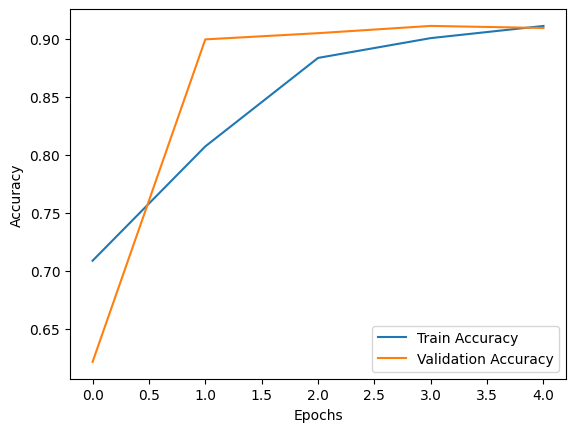

In [35]:
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [106]:
train_loss = history.history['loss'][-1]
val_loss = history.history['val_loss'][-1]

train_acc = history.history.get('accuracy', [None])[-1]
val_acc = history.history.get('val_accuracy', [None])[-1]

print("Final Train Loss:", round(train_loss, 4))
print("Final Val Loss:", round(val_loss, 4))

if train_acc is not None:
    print("Final Train Accuracy:", round(train_acc, 4))
    print("Final Val Accuracy:", round(val_acc, 4))

# Decision logic
if train_acc is not None:
    if train_acc < 0.7 and val_acc < 0.7:
        verdict = "UNDERFITTING ❌"
    elif train_acc - val_acc > 0.15:
        verdict = "OVERFITTING ⚠️"
    else:
        verdict = "GOOD FIT ✅"
else:
    if val_loss > train_loss * 1.3:
        verdict = "OVERFITTING ⚠️"
    else:
        verdict = "GOOD FIT ✅"

print("\n📌 MODEL STATUS:", verdict)


Final Train Loss: 0.184
Final Val Loss: 0.1932
Final Train Accuracy: 0.9311
Final Val Accuracy: 0.9285

📌 MODEL STATUS: GOOD FIT ✅


In [118]:
%%writefile app.py
import streamlit as st
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.models import load_model
import pickle

# -----------------------------
# Load pretrained objects
# -----------------------------
# 1️⃣ LSTM model
model = load_model("lstm_model.h5")  # your trained model

# 2️⃣ Tokenizer
with open("tokenizer.pkl", "rb") as f:
    tokenizer = pickle.load(f)

# 3️⃣ Max sequence length used during training
MAX_LEN = 100  # replace with your training sequence length

# -----------------------------
# Streamlit UI
# -----------------------------
st.title("Mental Health Text Classifier (Word2Vec + LSTM)")

user_input = st.text_area("Enter your text here:")

if st.button("Predict"):
    if user_input.strip() == "":
        st.warning("Please enter some text.")
    else:
        # -----------------------------
        # Preprocess input
        # -----------------------------
        seq = tokenizer.texts_to_sequences([user_input])
        padded_seq = pad_sequences(seq, maxlen=MAX_LEN, padding='post', truncating='post')

        # -----------------------------
        # Make prediction
        # -----------------------------
        prob = model.predict(padded_seq)[0][0]  # assuming output sigmoid
        label = 1 if prob >= 0.5 else 0
        risk = "HIGH RISK" if label == 1 else "LOW RISK"

        # -----------------------------
        # Display results
        # -----------------------------
        st.write(f"**Predicted Label:** {label} ({risk})")
        st.write(f"**Confidence:** {prob:.3f}")


Writing app.py


In [119]:
# -----------------------------
# Generate requirements.txt in Colab
# -----------------------------

requirements = """
streamlit==1.24.0
tensorflow==2.14.0
numpy==1.26.0
pandas==2.1.0
scikit-learn==1.3.0
gensim==4.3.0
"""

# Write to file
with open("requirements.txt", "w") as f:
    f.write(requirements)

print("requirements.txt file generated successfully!")

# Optional: download file
from google.colab import files
files.download("requirements.txt")


requirements.txt file generated successfully!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>